## YOLO & ResNet50

In [1]:
!pip install torch torchvision --quiet

In [1]:
import torchvision.models as models
import torchvision.transforms as transforms
from torchvision import datasets, transforms, models
import torch
from PIL import Image
from data.data_loader import load_cifar10, load_cifar100, load_imagenet, load_coco, load_wider
import matplotlib.pyplot as plt
import matplotlib.patches as patches
import torch
from torchvision.datasets import CocoDetection
import json

from torchvision.models.detection import fasterrcnn_resnet50_fpn
from torchvision.datasets import CIFAR100

### FASTERRCNN_RESNET50_FPN


https://pytorch.org/vision/main/models/generated/torchvision.models.detection.fasterrcnn_resnet50_fpn.html

In [2]:
# Load a pre-trained Faster R-CNN model
model = models.detection.fasterrcnn_resnet50_fpn(pretrained=True)
model.eval()

/opt/conda/lib/python3.10/site-packages/torchvision/models/_utils.py:208: UserWarning: The parameter 'pretrained' is deprecated since 0.13 and may be removed in the future, please use 'weights' instead.
  warnings.warn(
/opt/conda/lib/python3.10/site-packages/torchvision/models/_utils.py:223: UserWarning: Arguments other than a weight enum or `None` for 'weights' are deprecated since 0.13 and may be removed in the future. The current behavior is equivalent to passing `weights=FasterRCNN_ResNet50_FPN_Weights.COCO_V1`. You can also use `weights=FasterRCNN_ResNet50_FPN_Weights.DEFAULT` to get the most up-to-date weights.
  warnings.warn(msg)


FasterRCNN(
  (transform): GeneralizedRCNNTransform(
      Normalize(mean=[0.485, 0.456, 0.406], std=[0.229, 0.224, 0.225])
      Resize(min_size=(800,), max_size=1333, mode='bilinear')
  )
  (backbone): BackboneWithFPN(
    (body): IntermediateLayerGetter(
      (conv1): Conv2d(3, 64, kernel_size=(7, 7), stride=(2, 2), padding=(3, 3), bias=False)
      (bn1): FrozenBatchNorm2d(64, eps=0.0)
      (relu): ReLU(inplace=True)
      (maxpool): MaxPool2d(kernel_size=3, stride=2, padding=1, dilation=1, ceil_mode=False)
      (layer1): Sequential(
        (0): Bottleneck(
          (conv1): Conv2d(64, 64, kernel_size=(1, 1), stride=(1, 1), bias=False)
          (bn1): FrozenBatchNorm2d(64, eps=0.0)
          (conv2): Conv2d(64, 64, kernel_size=(3, 3), stride=(1, 1), padding=(1, 1), bias=False)
          (bn2): FrozenBatchNorm2d(64, eps=0.0)
          (conv3): Conv2d(64, 256, kernel_size=(1, 1), stride=(1, 1), bias=False)
          (bn3): FrozenBatchNorm2d(256, eps=0.0)
          (relu): ReLU(

In [3]:
# Cifar 100
trainloader, testloader  = load_cifar100(batch_size=64)
# fetch the first batch of images
images, labels = next(iter(trainloader))

# Select the first image for testing
image = images[0]

# pre-trained model
model = models.detection.fasterrcnn_resnet50_fpn(weights=models.detection.FasterRCNN_ResNet50_FPN_Weights.DEFAULT)
model.eval()

with torch.no_grad():
    prediction = model([image])

Files already downloaded and verified
Files already downloaded and verified


In [4]:
# def visualize_prediction(image, prediction, threshold=0.5):
#     # Images to numpy array
#     image_np = image.permute(1, 2, 0).numpy()

#     fig, ax = plt.subplots(1, figsize=(12, 9))
#     ax.imshow(image_np)

#     # Pull the bounding boxes and labels
#     for box, label, score in zip(prediction[0]['boxes'], prediction[0]['labels'], prediction[0]['scores']):
#         if score >= threshold:
#             x, y, xmax, ymax = box
#             rect = patches.Rectangle((x, y), xmax - x, ymax - y, linewidth=2, edgecolor='r', facecolor='none')
#             ax.add_patch(rect)
#             ax.text(x, y, f'Label: {label}, Score: {score:.2f}', color='white', backgroundcolor='red')

#     plt.show()

# visualize_prediction(image, prediction)

In [5]:
# dataset = CIFAR100(root='./data', train=False, download=True, transform=T.ToTensor())
# image, _ = dataset[0]  # Using the first image for an example

# # Run the model on the image
# with torch.no_grad():
#     prediction = model([image])

# def visualize_prediction(image, prediction, threshold=0.5):
#     image_np = image.permute(1, 2, 0).numpy()

#     fig, ax = plt.subplots(1, figsize=(12, 9))
#     ax.imshow(image_np)

#     for box, label, score in zip(prediction[0]['boxes'], prediction[0]['labels'], prediction[0]['scores']):
#         if score >= threshold:
#             x, y, xmax, ymax = box
#             rect = patches.Rectangle((x, y), xmax - x, ymax - y, linewidth=2, edgecolor='r', facecolor='none')
#             ax.add_patch(rect)
#             ax.text(x, y, f'Label: {label}, Score: {score:.2f}', color='white', backgroundcolor='red')

#     plt.show()

# visualize_prediction(image, prediction)

In [4]:
### Val Dataset

data_dir = '/home/ubuntu/W210-Capstone/notebooks/data_coco/data'
# train_loader, test_loader = load_coco(data_dir)


val_dataset = CocoDetection(root=f'{data_dir}/val2017', 
                            annFile=f'{data_dir}/annotations/instances_val2017.json', 
                            transform=transforms.Compose([transforms.ToTensor()]))

# ### Val Dataset

# data_dir = '/home/ubuntu/W210-Capstone/notebooks/data_coco/data'
# # train_loader, test_loader = load_coco(data_dir)


# val_dataset = CocoDetection(root=f'{data_dir}/val2017', 
#                             annFile=f'{data_dir}/annotations/instances_val2017.json',
#                             transform = transforms.Compose([
#                                 transforms.Resize((256, 256)),
#                                 transforms.ToTensor(),
#                                 transforms.Normalize(
#                                     mean=[0.485, 0.456, 0.406],
#                                     std=[0.229, 0.224, 0.225])
#                             # transform=T.Compose([T.ToTensor()])
#                             ])
# )
                            




loading annotations into memory...
Done (t=0.58s)
creating index...
index created!


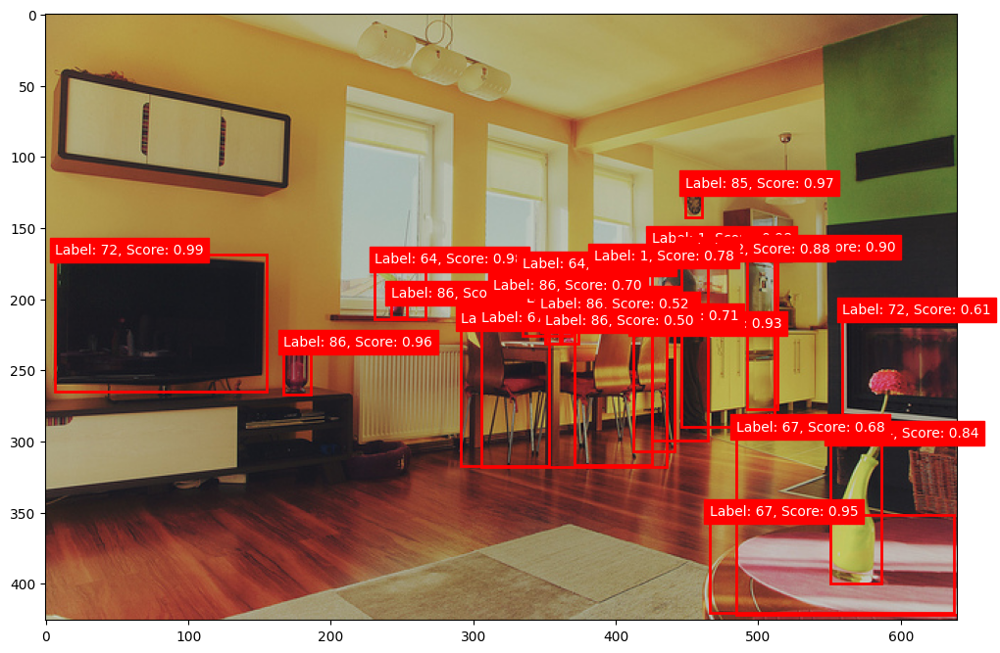

In [7]:

# # Load the COCO validation dataset (adjust paths if necessary)
# # Make sure to download and extract the dataset beforehand

# data_dir = '/home/ubuntu/W210-Capstone/notebooks/data_coco/data'
# # train_loader, test_loader = load_coco(data_dir)


# val_dataset = CocoDetection(root=f'{data_dir}/val2017', 
#                             annFile=f'{data_dir}/annotations/instances_val2017.json', 
#                             transform=T.Compose([T.ToTensor()]))

# ### Val Dataset

# data_dir = '/home/ubuntu/W210-Capstone/notebooks/data_coco/data'
# # train_loader, test_loader = load_coco(data_dir)


# val_dataset = CocoDetection(root=f'{data_dir}/val2017', 
#                             annFile=f'{data_dir}/annotations/instances_val2017.json',
#                             transform = transforms.Compose([
#                                 transforms.Resize((256, 256)),
#                                 transforms.ToTensor(),
#                                 transforms.Normalize(
#                                     mean=[0.485, 0.456, 0.406],
#                                     std=[0.229, 0.224, 0.225])
#                             # transform=T.Compose([T.ToTensor()])
#                             ])
# )
                            




# Load a single image from the COCO dataset
image, target = val_dataset[0]  # Using the first image for demonstration

# Load the pre-trained Faster R-CNN model
model = fasterrcnn_resnet50_fpn(pretrained=True)
model.eval()

# Run the model on the image
with torch.no_grad():
    prediction = model([image])

# Visualization function
def visualize_prediction(image, prediction, threshold=0.5):
    image_np = image.permute(1, 2, 0).numpy()
    fig, ax = plt.subplots(1, figsize=(12, 9))
    ax.imshow(image_np)

    for box, label, score in zip(prediction[0]['boxes'], prediction[0]['labels'], prediction[0]['scores']):
        if score >= threshold:
            x, y, xmax, ymax = box
            rect = patches.Rectangle((x, y), xmax - x, ymax - y, linewidth=2, edgecolor='r', facecolor='none')
            ax.add_patch(rect)
            ax.text(x, y, f'Label: {label}, Score: {score:.2f}', color='white', backgroundcolor='red')

    plt.show()

# Visualize the prediction
visualize_prediction(image, prediction)


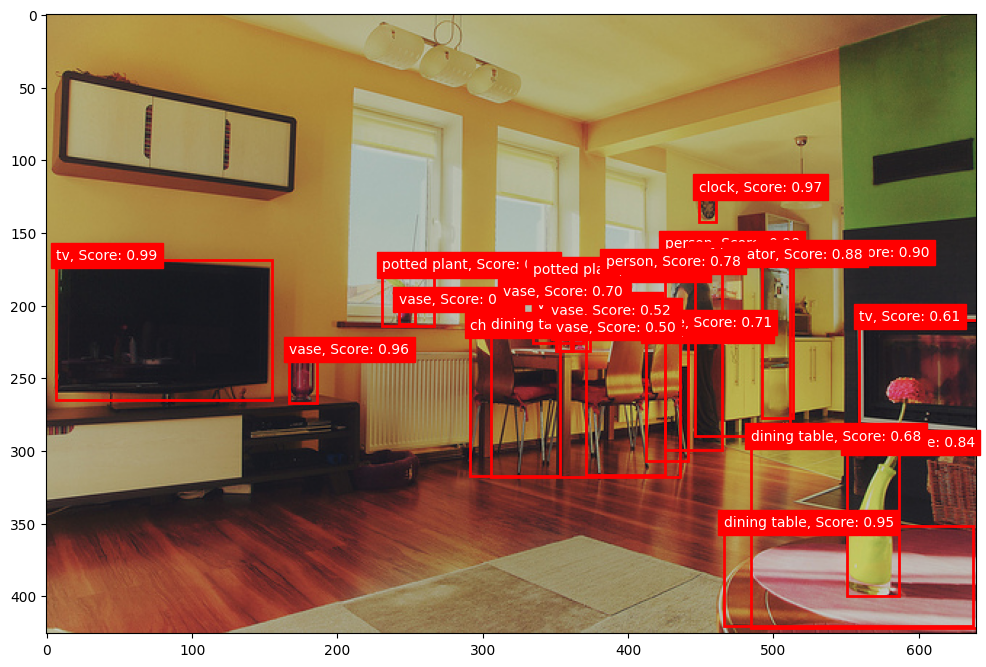

In [8]:
with open(f'{data_dir}/annotations/instances_val2017.json') as f:
    categories = json.load(f)['categories']
category_dict = {cat['id']: cat['name'] for cat in categories}

def visualize_prediction(image, prediction, threshold=0.5):
    image_np = image.permute(1, 2, 0).numpy()
    fig, ax = plt.subplots(1, figsize=(12, 9))
    ax.imshow(image_np)

    for box, label, score in zip(prediction[0]['boxes'], prediction[0]['labels'], prediction[0]['scores']):
        if score >= threshold:
            label_name = category_dict.get(label.item(), 'Unknown')  # Convert label ID to name
            x, y, xmax, ymax = box
            rect = patches.Rectangle((x, y), xmax - x, ymax - y, linewidth=2, edgecolor='r', facecolor='none')
            ax.add_patch(rect)
            ax.text(x, y, f'{label_name}, Score: {score:.2f}', color='white', backgroundcolor='red')

    plt.show()

visualize_prediction(image, prediction)


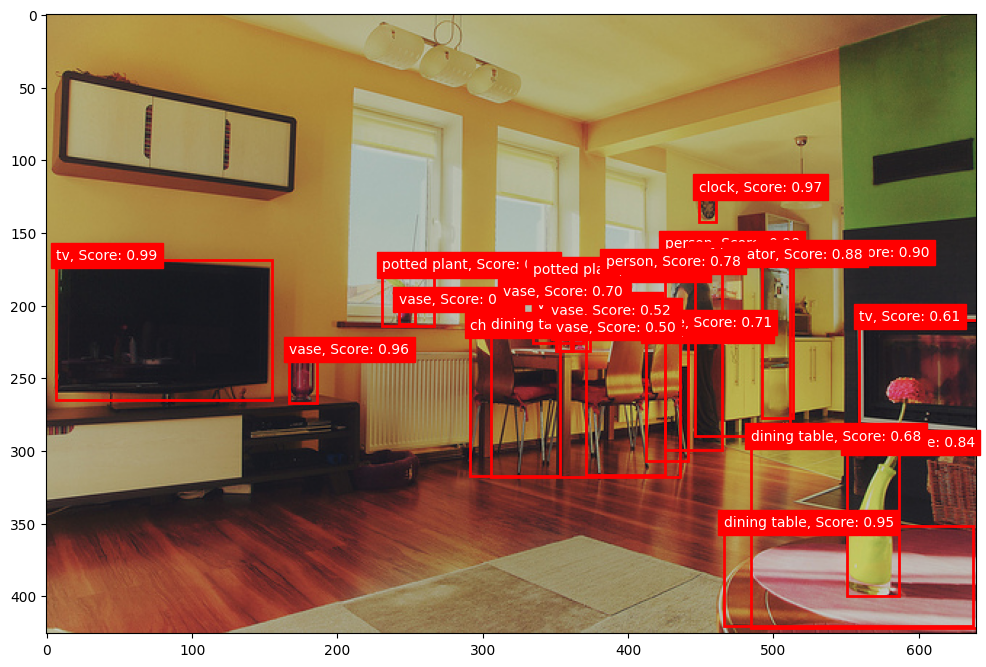

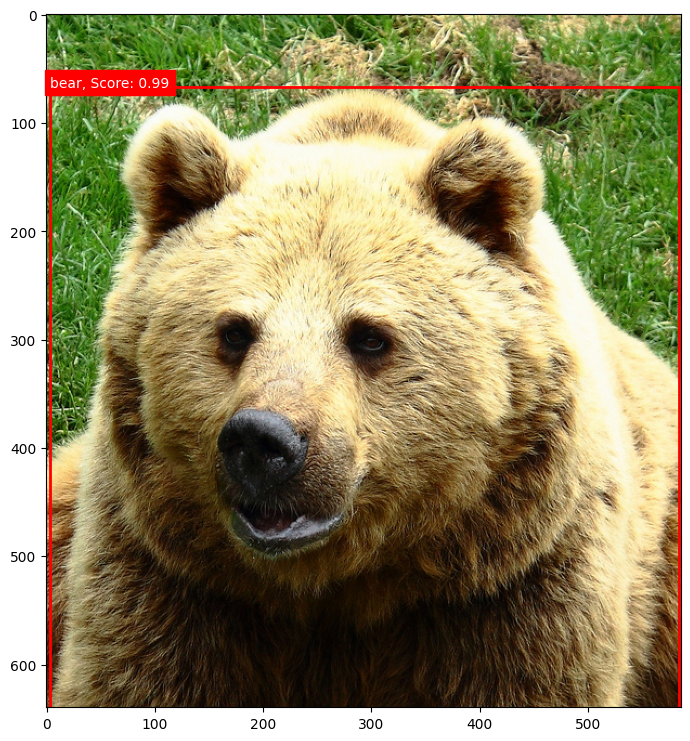

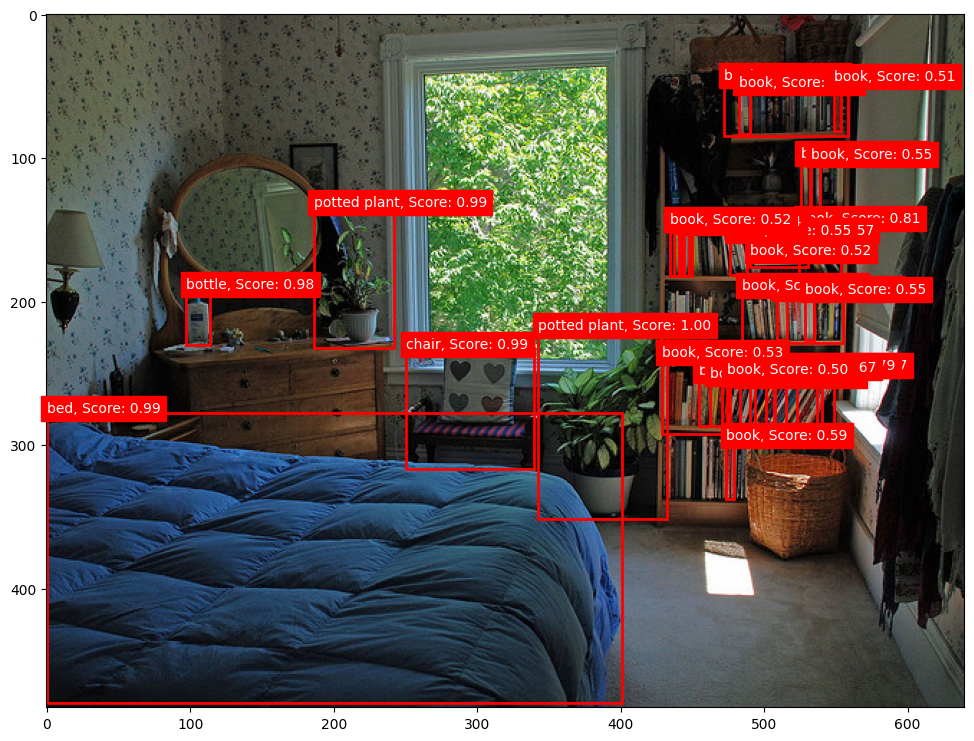

In [10]:
# Diplay example images
num_images_to_display = 3  
for i in range(num_images_to_display):

    image, target = val_dataset[i]

    model.eval() # resnet50
    with torch.no_grad():
        prediction = model([image])

    visualize_prediction(image, prediction)
    plt.pause(1)


In [9]:
# ### Val Dataset

# data_dir = '/home/ubuntu/W210-Capstone/notebooks/data_coco/data'
# # train_loader, test_loader = load_coco(data_dir)


# val_dataset = CocoDetection(root=f'{data_dir}/val2017', 
#                             annFile=f'{data_dir}/annotations/instances_val2017.json',
#                             transform = transforms.Compose([
#                                 transforms.Resize((256, 256)),
#                                 transforms.ToTensor(),
#                                 transforms.Normalize(
#                                     mean=[0.485, 0.456, 0.406],
#                                     std=[0.229, 0.224, 0.225])
#                             # transform=T.Compose([T.ToTensor()])
#                             ])
# )
                            




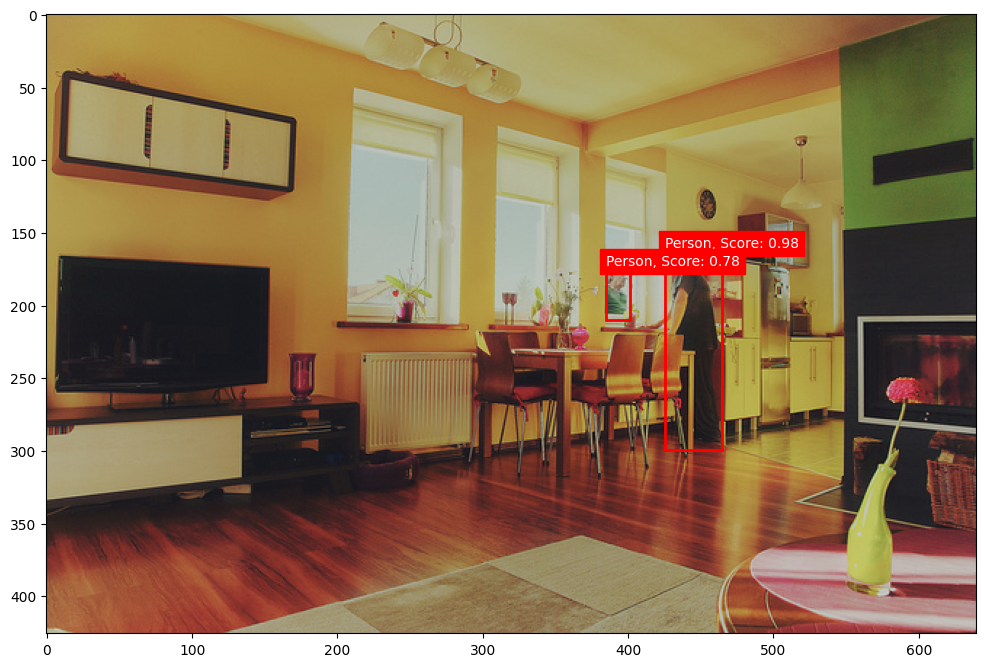

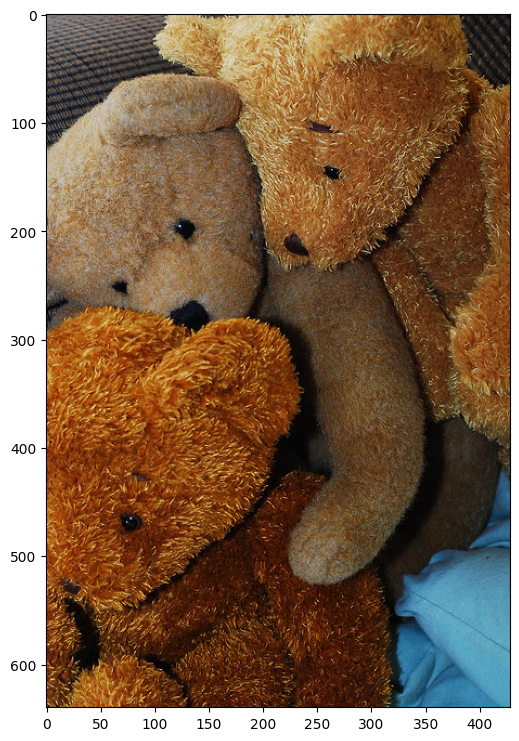

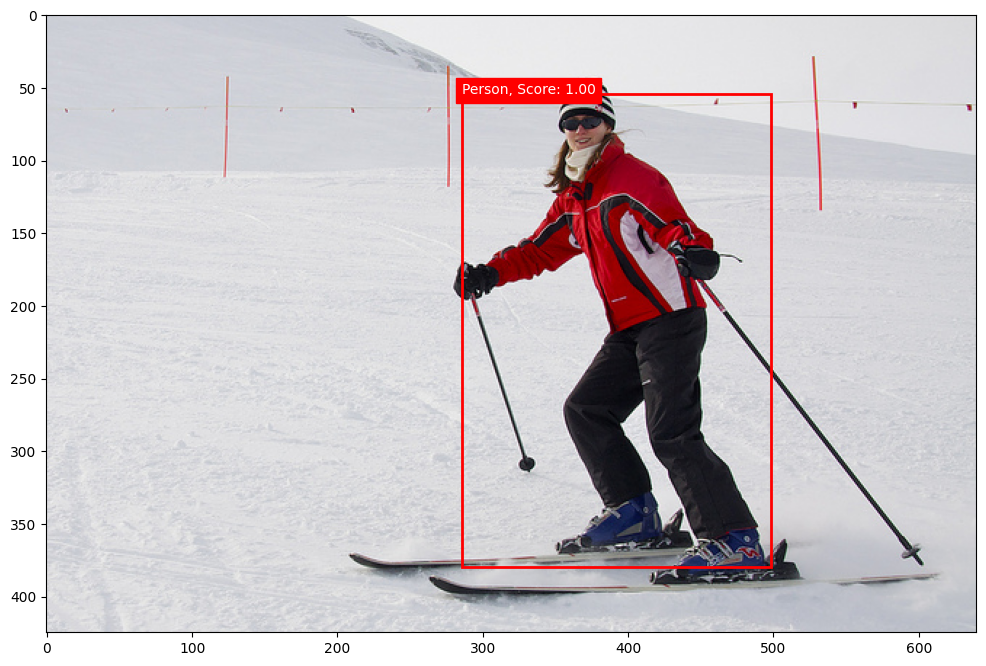

In [11]:
# Filter "person" predictions only - bounding box

def visualize_person_prediction(image, prediction, threshold=0.5):
    image_np = image.permute(1, 2, 0).numpy()
    fig, ax = plt.subplots(1, figsize=(12, 9))
    ax.imshow(image_np)

    person_detected = False
    for box, label, score in zip(prediction[0]['boxes'], prediction[0]['labels'], prediction[0]['scores']):
        if score >= threshold and label == 1:  # 1 == 'person'
            person_detected = True
            x, y, xmax, ymax = box
            rect = patches.Rectangle((x, y), xmax - x, ymax - y, linewidth=2, 
                                     edgecolor='r', facecolor='none')
            ax.add_patch(rect)
            ax.text(x, y, f'Person, Score: {score:.2f}', color='white', backgroundcolor='red')
    
    if person_detected:
        plt.show()

# Visualize predictions for three images where 'person' is detected
num_images_to_display = 3
images_displayed = 0
for image, target in val_dataset:
    model.eval()
    with torch.no_grad():
        prediction = model([image])

    if any(label == 1 for label in prediction[0]['labels']):
        visualize_person_prediction(image, prediction)
        images_displayed += 1
        if images_displayed >= num_images_to_display:
            break


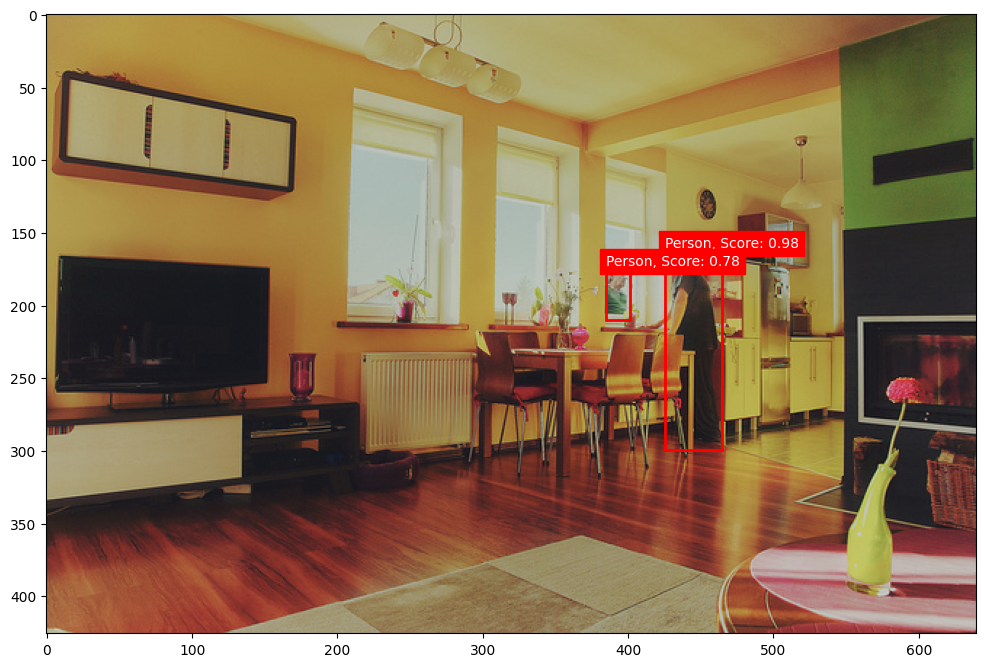

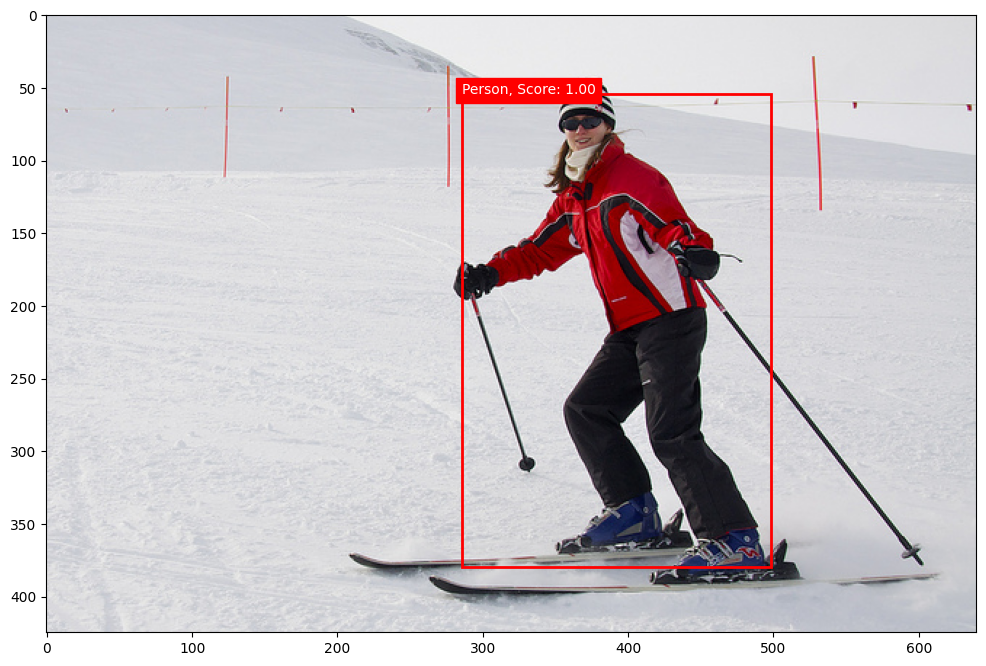

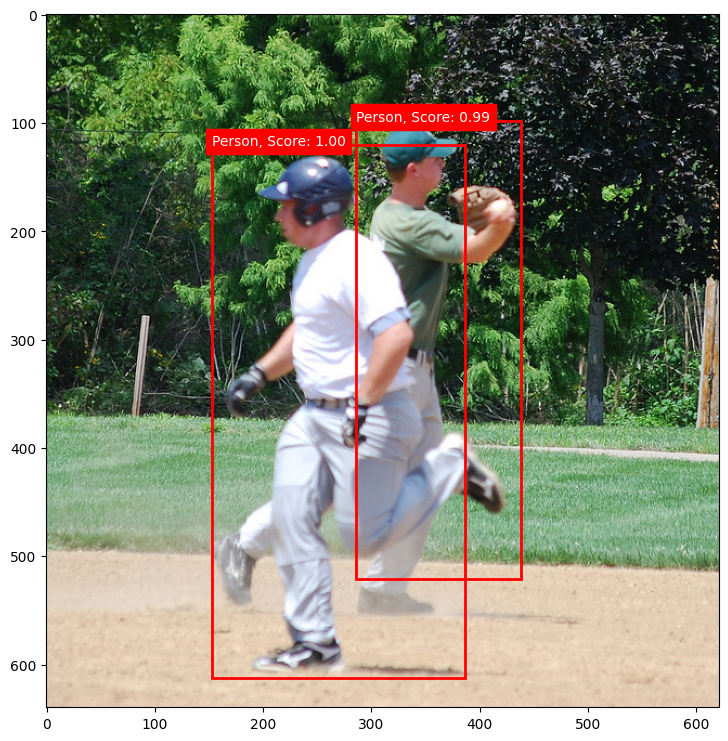

In [12]:
# Filter "person" predictions only

def is_person_predicted(prediction, threshold=0.5):
    for label, score in zip(prediction[0]['labels'], prediction[0]['scores']):
        if score >= threshold and label == 1:  # Label 1 is 'person'
            return True
    return False

def visualize_prediction(image, prediction, threshold=0.5):
    image_np = image.permute(1, 2, 0).numpy()
    fig, ax = plt.subplots(1, figsize=(12, 9))
    ax.imshow(image_np)

    for box, label, score in zip(prediction[0]['boxes'], prediction[0]['labels'], prediction[0]['scores']):
        if score >= threshold and label == 1:  # Only visualize 'person'
            x, y, xmax, ymax = box
            rect = patches.Rectangle((x, y), xmax - x, ymax - y, linewidth=2, edgecolor='r', facecolor='none')
            ax.add_patch(rect)
            ax.text(x, y, f'Person, Score: {score:.2f}', color='white', backgroundcolor='red')

    plt.show()

num_images_to_display = 3
images_displayed = 0

for image, target in val_dataset:
    model = models.detection.fasterrcnn_resnet50_fpn(weights=models.detection.FasterRCNN_ResNet50_FPN_Weights.DEFAULT)
    model.eval()
    with torch.no_grad():
        prediction = model([image])

    # Check if 'person' is predicted
    if is_person_predicted(prediction):
        visualize_prediction(image, prediction)
        images_displayed += 1
        if images_displayed >= num_images_to_display:
            break


## YOLO

In [47]:
# !git clone https://github.com/ultralytics/yolov5
# !cd yolov5

fatal: destination path 'yolov5' already exists and is not an empty directory.


In [1]:
from yolov5.models.yolo import Model
import torch
from torchvision.models.detection import fasterrcnn_resnet50_fpn, FasterRCNN_ResNet50_FPN_Weights
import torchvision.transforms as transforms
from torchvision.datasets import CocoDetection
import matplotlib.pyplot as plt
import matplotlib.patches as patches
from sklearn.metrics import accuracy_score, f1_score, precision_score, recall_score, roc_auc_score
from sklearn.preprocessing import label_binarize
import numpy as np
import torch.hub
from torchvision.ops import box_iou
from torch.utils.data import Subset

In [2]:
yolo = torch.hub.load('ultralytics/yolov5', 'yolov5s', pretrained=True)  
# yolo = torch.hub.load('ultralytics/yolov5', 'yolov5s', pretrained=True)

yolo.eval()
### Other yolo model options
# 'yolov5s'
# 'yolov5l'
# 'yolov5x'

Using cache found in /home/ubuntu/.cache/torch/hub/ultralytics_yolov5_master
YOLOv5 🚀 v7.0-240-g84ec8b5 Python-3.10.9 torch-2.1.0+cu121 CUDA:0 (NVIDIA A10G, 22724MiB)

Fusing layers... 
YOLOv5s summary: 213 layers, 7225885 parameters, 0 gradients, 16.4 GFLOPs
Adding AutoShape... 


AutoShape(
  (model): DetectMultiBackend(
    (model): DetectionModel(
      (model): Sequential(
        (0): Conv(
          (conv): Conv2d(3, 32, kernel_size=(6, 6), stride=(2, 2), padding=(2, 2))
          (act): SiLU(inplace=True)
        )
        (1): Conv(
          (conv): Conv2d(32, 64, kernel_size=(3, 3), stride=(2, 2), padding=(1, 1))
          (act): SiLU(inplace=True)
        )
        (2): C3(
          (cv1): Conv(
            (conv): Conv2d(64, 32, kernel_size=(1, 1), stride=(1, 1))
            (act): SiLU(inplace=True)
          )
          (cv2): Conv(
            (conv): Conv2d(64, 32, kernel_size=(1, 1), stride=(1, 1))
            (act): SiLU(inplace=True)
          )
          (cv3): Conv(
            (conv): Conv2d(64, 64, kernel_size=(1, 1), stride=(1, 1))
            (act): SiLU(inplace=True)
          )
          (m): Sequential(
            (0): Bottleneck(
              (cv1): Conv(
                (conv): Conv2d(32, 32, kernel_size=(1, 1), stride=(1, 1))
  

In [3]:
## Faster R-CNN
faster_rcnn = fasterrcnn_resnet50_fpn(weights=FasterRCNN_ResNet50_FPN_Weights.DEFAULT)
faster_rcnn.eval()

FasterRCNN(
  (transform): GeneralizedRCNNTransform(
      Normalize(mean=[0.485, 0.456, 0.406], std=[0.229, 0.224, 0.225])
      Resize(min_size=(800,), max_size=1333, mode='bilinear')
  )
  (backbone): BackboneWithFPN(
    (body): IntermediateLayerGetter(
      (conv1): Conv2d(3, 64, kernel_size=(7, 7), stride=(2, 2), padding=(3, 3), bias=False)
      (bn1): FrozenBatchNorm2d(64, eps=0.0)
      (relu): ReLU(inplace=True)
      (maxpool): MaxPool2d(kernel_size=3, stride=2, padding=1, dilation=1, ceil_mode=False)
      (layer1): Sequential(
        (0): Bottleneck(
          (conv1): Conv2d(64, 64, kernel_size=(1, 1), stride=(1, 1), bias=False)
          (bn1): FrozenBatchNorm2d(64, eps=0.0)
          (conv2): Conv2d(64, 64, kernel_size=(3, 3), stride=(1, 1), padding=(1, 1), bias=False)
          (bn2): FrozenBatchNorm2d(64, eps=0.0)
          (conv3): Conv2d(64, 256, kernel_size=(1, 1), stride=(1, 1), bias=False)
          (bn3): FrozenBatchNorm2d(256, eps=0.0)
          (relu): ReLU(

In [4]:
### Val Dataset

data_dir = '/home/ubuntu/W210-Capstone/notebooks/data_coco/data'
# train_loader, test_loader = load_coco(data_dir)
val_dataset = CocoDetection(root=f'{data_dir}/val2017', 
                            annFile=f'{data_dir}/annotations/instances_val2017.json', 
                            transform=transforms.Compose([transforms.ToTensor()]))

loading annotations into memory...
Done (t=0.50s)
creating index...
index created!


In [5]:
# Subset COCO val_dataset
subset_size = int(0.1 * len(val_dataset))
subset_indices = np.random.choice(len(val_dataset), subset_size, replace=False)

# subset_val_dataset = Subset(val_dataset, subset_indices)
val_dataset = Subset(val_dataset, subset_indices)


In [6]:
# def yolo_predict(yolo_model, image):
#     # Resize image to YOLO input size (for example, 640x640)
#     resize_transform = transforms.Compose([transforms.Resize((640, 640))])
#     image_resized = resize_transform(image)

#     results = yolo_model(image_resized.unsqueeze(0))
#     predictions = results.pred[0]
#     return {'boxes': predictions[:, :4], 'labels': predictions[:, 5], 'scores': predictions[:, 4]}


In [7]:
def yolo_predict(yolo_model, image):
    # Resize
    resize_transform = transforms.Compose([transforms.Resize((640, 640))])
    image_resized = resize_transform(image)

    # Prediction
    results = yolo_model(image_resized.unsqueeze(0))
    predictions = results

    # Bounding boxes, scores, lables
    boxes = predictions[:, :4]  
    scores = predictions[:, 4] 
    labels = predictions[:, 5].int() 

    return {'boxes': boxes, 'labels': labels, 'scores': scores}


In [8]:
############## Touble shooting

def yolo_predict(yolo_model, image):
    
    # Resize
    resize_transform = transforms.Compose([transforms.Resize((640, 640))])
    image_resized = resize_transform(image)

    with torch.no_grad():
        results = yolo_model(image_resized.unsqueeze(0))

    if results.dim() == 3 and results.size(2) >= 85:
        all_predictions = results.squeeze(0)  
        boxes = all_predictions[:, :4]  
        scores = all_predictions[:, 4]
        labels = torch.argmax(all_predictions[:, 5:], dim=1)
    else:
        raise RuntimeError(f"Unexpected results shape: {results.shape}")

    return {'boxes': boxes, 'labels': labels, 'scores': scores}


In [9]:
# def calculate_metrics(pred_boxes, pred_labels, pred_scores, true_boxes, true_labels, iou_threshold=0.5):
#     true_positives = 0
#     predicted_positives = len(pred_boxes)
#     actual_positives = len(true_boxes)

#     print(f"Number of predicted boxes: {predicted_positives}")

#     for pred_box, pred_label, pred_score in zip(pred_boxes, pred_labels, pred_scores):
#         print(f"Pred box: {pred_box}, Pred label: {pred_label}, Pred score: {pred_score}")

#         # Ensure pred_score is a single-value Python float
#         if pred_score.numel() != 1:
#             raise RuntimeError(f"Expected single-element tensor, got tensor with {pred_score.numel()} elements.")
#         pred_score = pred_score.item()

#         # Consider only high confidence predictions
#         if pred_score < iou_threshold:
#             continue

#         # Calculate IoU with ground truth boxes
#         ious = box_iou(pred_box.unsqueeze(0), true_boxes)
        
#         # Check if the predicted box matches any true box
#         if any(ious[0] > iou_threshold) and pred_label == true_labels[torch.argmax(ious[0])]:
#             true_positives += 1

#     precision = true_positives / predicted_positives if predicted_positives > 0 else 0
#     recall = true_positives / actual_positives if actual_positives > 0 else 0
#     f1 = 2 * (precision * recall) / (precision + recall) if precision + recall > 0 else 0

#     return precision, recall, f1


In [10]:
# def calculate_metrics(pred_boxes, pred_labels, pred_scores, true_boxes, true_labels, iou_threshold=0.5):

#     pred_boxes = pred_boxes.to(device)
#     pred_labels = pred_labels.to(device)
#     pred_scores = pred_scores.to(device)
#     true_boxes = true_boxes.to(device)
#     true_labels = true_labels.to(device)

#     true_positives = 0
#     predicted_positives = len(pred_boxes)
#     actual_positives = len(true_boxes)

#     if true_boxes.dim() == 1:
#         true_boxes = true_boxes.unsqueeze(0)
#     elif true_boxes.dim() != 2 or true_boxes.size(1) != 4:
#         raise RuntimeError("true_boxes must have shape [N, 4]")

#     # Ensure pred_boxes is in the correct shape [M, 4]
#     if pred_boxes.dim() != 2 or pred_boxes.size(1) != 4:
#         raise RuntimeError("pred_boxes must have shape [M, 4]")

#     for i in range(predicted_positives):
#         pred_box = pred_boxes[i]
#         pred_label = pred_labels[i]
#         pred_score = pred_scores[i]

#         # Handle single or multiple element tensors for score
#         if pred_score.numel() == 1:
#             score_value = pred_score.item()
#         elif pred_score.numel() > 1:
#             score_value = pred_score[0].item()
#         else:
#             raise RuntimeError(f"Unexpected structure for pred_score with {pred_score.numel()} elements.")

#         # Consider only high confidence predictions
#         if score_value < iou_threshold:
#             continue

#         # Calculate IoU with ground truth boxes
#         ious = box_iou(pred_box.unsqueeze(0), true_boxes)

#         # Check if the predicted box matches any true box
#         if any(ious[0] > iou_threshold) and pred_label == true_labels[torch.argmax(ious[0])]:
#             true_positives += 1

#     precision = true_positives / predicted_positives if predicted_positives > 0 else 0
#     recall = true_positives / actual_positives if actual_positives > 0 else 0
#     f1 = 2 * (precision * recall) / (precision + recall) if precision + recall > 0 else 0

#     return precision, recall, f1


In [11]:
def calculate_metrics(pred_boxes, pred_labels, pred_scores, true_boxes, true_labels, iou_threshold=0.5):
        
    pred_boxes = pred_boxes.to(device)
    pred_labels = pred_labels.to(device)
    pred_scores = pred_scores.to(device)
    true_boxes = true_boxes.to(device)
    true_labels = true_labels.to(device)
    
    # Check and handle empty inputs
    if pred_boxes.nelement() == 0 or true_boxes.nelement() == 0:
        return 0.0, 0.0, 0.0

    # Check the shape of pred_boxes and true_boxes
    if pred_boxes.dim() != 2 or pred_boxes.size(1) != 4:
        raise ValueError(f"Expected pred_boxes to have shape [M, 4], got {pred_boxes.shape}")
    if true_boxes.dim() != 2 or true_boxes.size(1) != 4:
        raise ValueError(f"Expected true_boxes to have shape [N, 4], got {true_boxes.shape}")

    # Initialize metrics
    true_positives = 0
    false_positives = 0
    false_negatives = len(true_boxes)

    # Iterate over predicted boxes
    for i in range(len(pred_boxes)):
        pred_box = pred_boxes[i]
        pred_label = pred_labels[i]

        # Compute IoU
        ious = box_iou(pred_box.unsqueeze(0), true_boxes)

        # Find best match and update counts
        max_iou, max_idx = ious[0].max(0)
        if max_iou >= iou_threshold and pred_label == true_labels[max_idx]:
            true_positives += 1
            false_negatives -= 1
        else:
            false_positives += 1

    # Calculate precision, recall, and F1-score
    precision = true_positives / (true_positives + false_positives) if true_positives + false_positives > 0 else 0
    recall = true_positives / (true_positives + false_negatives) if true_positives + false_negatives > 0 else 0
    f1 = 2 * (precision * recall) / (precision + recall) if precision + recall > 0 else 0

    return precision, recall, f1

In [14]:
device = 'cuda:0' if torch.cuda.is_available() else 'cpu'
faster_rcnn = faster_rcnn.to(device)
yolo = yolo.to(device)

In [16]:
# Initialize metric collections
faster_rcnn_metrics = {'precision': [], 'recall': [], 'f1': []}
yolo_metrics = {'precision': [], 'recall': [], 'f1': []}

for image, targets in val_dataset:
    image = image.to(device)
    true_boxes = torch.tensor([t['bbox'] for t in targets])  # Convert list of bbox to tensor
    true_labels = torch.tensor([t['category_id'] for t in targets])  # Convert list of category_id to tensor

    with torch.no_grad():
        # Predict with Faster R-CNN
        fr_prediction = faster_rcnn([image])[0]
        fr_boxes = fr_prediction['boxes']
        fr_labels = fr_prediction['labels']
        fr_scores = fr_prediction['scores']

        # Predict with YOLO
        yolo_prediction = yolo_predict(yolo, image)  # Replace with actual YOLO prediction function
        # Assuming yolo_prediction is a dict with 'boxes', 'labels', and 'scores'
        yl_boxes = yolo_prediction['boxes']
        yl_labels = yolo_prediction['labels']
        yl_scores = yolo_prediction['scores']

        # Calculate and update metrics for Faster R-CNN
        fr_precision, fr_recall, fr_f1 = calculate_metrics(fr_boxes, fr_labels, fr_scores, true_boxes, true_labels)
        faster_rcnn_metrics['precision'].append(fr_precision)
        faster_rcnn_metrics['recall'].append(fr_recall)
        faster_rcnn_metrics['f1'].append(fr_f1)

        # Calculate and update metrics for YOLO
        yl_precision, yl_recall, yl_f1 = calculate_metrics(yl_boxes, yl_labels, yl_scores, true_boxes, true_labels)
        yolo_metrics['precision'].append(yl_precision)
        yolo_metrics['recall'].append(yl_recall)
        yolo_metrics['f1'].append(yl_f1)


In [17]:
# Calculate average metrics
rcnn_avg_metrics = {k: np.mean(v) for k, v in faster_rcnn_metrics.items()}
print(f'faster_rcnn_metrics; {rcnn_avg_metrics}')

yolo_avg_metrics = {k: np.mean(v) for k, v in yolo_metrics.items()}
print(f'yolo_metrics: {yolo_avg_metrics}')

faster_rcnn_metrics; {'precision': 0.027872768325322803, 'recall': 0.15160180554240527, 'f1': 0.045062430207504764}
yolo_metrics: {'precision': 0.0, 'recall': 0.0, 'f1': 0.0}


In [19]:
#### Add accuracy
def calculate_metrics(pred_boxes, pred_labels, pred_scores, true_boxes, true_labels, iou_threshold=0.5):
    
    pred_boxes = pred_boxes.to(device)
    pred_labels = pred_labels.to(device)
    pred_scores = pred_scores.to(device)
    true_boxes = true_boxes.to(device)
    true_labels = true_labels.to(device)
    
    # Check and handle empty inputs
    if pred_boxes.nelement() == 0 or true_boxes.nelement() == 0:
        return 0.0, 0.0, 0.0, 0.0

    # Initialize metrics
    true_positives = 0
    false_positives = 0
    false_negatives = len(true_boxes)
    total_predictions = len(pred_boxes)

    # Iterate over predicted boxes
    for i in range(len(pred_boxes)):
        pred_box = pred_boxes[i]
        pred_label = pred_labels[i]

        # Compute IoU
        ious = box_iou(pred_box.unsqueeze(0), true_boxes)

        # Find best match and update counts
        max_iou, max_idx = ious[0].max(0)
        if max_iou >= iou_threshold and pred_label == true_labels[max_idx]:
            true_positives += 1
            false_negatives -= 1
        else:
            false_positives += 1

    # Calculate precision, recall, and F1-score
    precision = true_positives / (true_positives + false_positives) if true_positives + false_positives > 0 else 0
    recall = true_positives / (true_positives + false_negatives) if true_positives + false_negatives > 0 else 0
    f1 = 2 * (precision * recall) / (precision + recall) if precision + recall > 0 else 0

    # Calculate accuracy
    accuracy = true_positives / total_predictions if total_predictions > 0 else 0

    return precision, recall, f1, accuracy


In [20]:
device = 'cuda:0' if torch.cuda.is_available() else 'cpu'
faster_rcnn = faster_rcnn.to(device)
yolo = yolo.to(device)

In [21]:

# Initialize metric collections with accuracy added
faster_rcnn_metrics = {'precision': [], 'recall': [], 'f1': [], 'accuracy': []}
yolo_metrics = {'precision': [], 'recall': [], 'f1': [], 'accuracy': []}

for image, targets in val_dataset:
    image = image.to(device)
    true_boxes = torch.tensor([t['bbox'] for t in targets]).to(device)  # Convert list of bbox to tensor
    true_labels = torch.tensor([t['category_id'] for t in targets]).to(device)  # Convert list of category_id to tensor

    with torch.no_grad():
        # Predict with Faster R-CNN
        fr_prediction = faster_rcnn([image])[0]
        fr_boxes = fr_prediction['boxes']
        fr_labels = fr_prediction['labels']
        fr_scores = fr_prediction['scores']

        # Predict with YOLO
        yolo_prediction = yolo_predict(yolo, image)
        yl_boxes = yolo_prediction['boxes']
        yl_labels = yolo_prediction['labels']
        yl_scores = yolo_prediction['scores']

        # Calculate and update metrics for Faster R-CNN
        fr_precision, fr_recall, fr_f1, fr_accuracy = calculate_metrics(fr_boxes, fr_labels, fr_scores, true_boxes, true_labels)
        faster_rcnn_metrics['precision'].append(fr_precision)
        faster_rcnn_metrics['recall'].append(fr_recall)
        faster_rcnn_metrics['f1'].append(fr_f1)
        faster_rcnn_metrics['accuracy'].append(fr_accuracy)

        # Calculate and update metrics for YOLO
        yl_precision, yl_recall, yl_f1, yl_accuracy = calculate_metrics(yl_boxes, yl_labels, yl_scores, true_boxes, true_labels)
        yolo_metrics['precision'].append(yl_precision)
        yolo_metrics['recall'].append(yl_recall)
        yolo_metrics['f1'].append(yl_f1)
        yolo_metrics['accuracy'].append(yl_accuracy)

        # print(f"Image Metrics:\n"
        #       f"Faster R-CNN - Precision: {fr_precision}, Recall: {fr_recall}, F1: {fr_f1}, Accuracy: {fr_accuracy}\n"
        #       f"YOLO - Precision: {yl_precision}, Recall: {yl_recall}, F1: {yl_f1}, Accuracy: {yl_accuracy}")


In [22]:
# Calculate average metrics
rcnn_avg_metrics = {k: np.mean(v) for k, v in faster_rcnn_metrics.items()}
print(f'faster_rcnn_metrics; {rcnn_avg_metrics}')

yolo_avg_metrics = {k: np.mean(v) for k, v in yolo_metrics.items()}
print(f'yolo_metrics: {yolo_avg_metrics}')

faster_rcnn_metrics; {'precision': 0.030348600685137506, 'recall': 0.17566150022236604, 'f1': 0.04927527672657051, 'accuracy': 0.030348600685137506}
yolo_metrics: {'precision': 7.936507936507937e-08, 'recall': 0.002, 'f1': 1.5872386016427922e-07, 'accuracy': 7.936507936507937e-08}
